<a href="https://colab.research.google.com/github/Mirabelljoicelaura/PCVK/blob/main/UAS_PCVK_OCR/UAS_PCVK_(2).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import imutils
import cv2
from tensorflow.keras.models import load_model
from imutils.contours import sort_contours
from google.colab.patches import cv2_imshow

In [ ]:
network = load_model('/content/drive/MyDrive/PCVK/network')
# check summary
network.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 13, 13, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 6, 6, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 128)         73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 2, 2, 128)         0

##PREPROCESSING

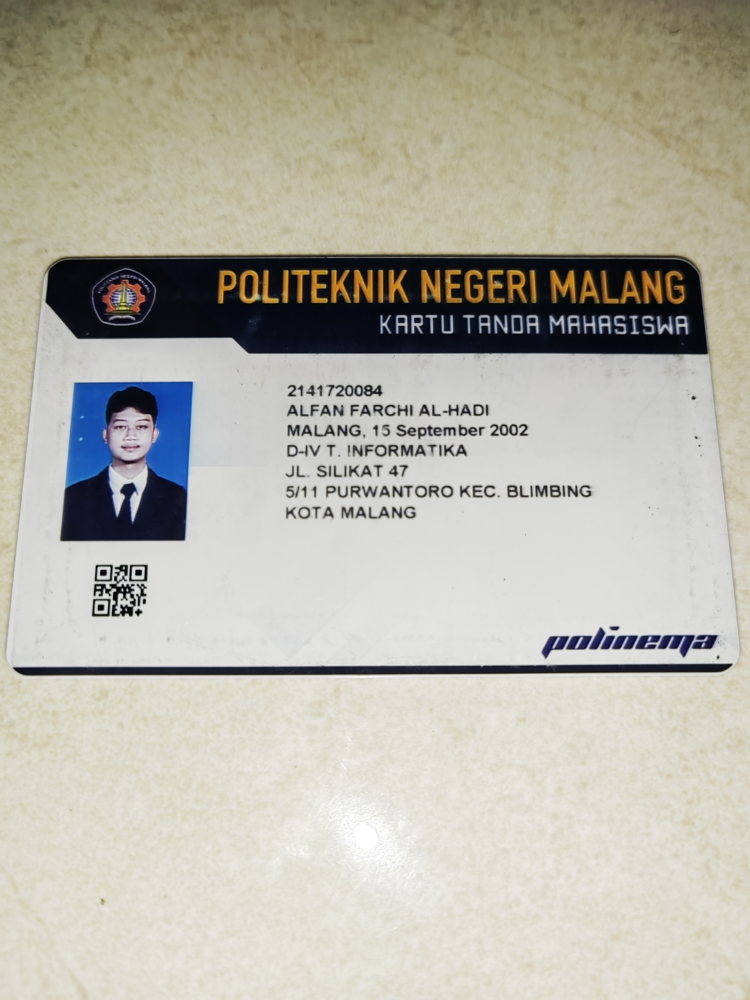

In [ ]:
image = cv2.imread('/content/drive/MyDrive/PCVK/Dataset_Kelompok4/3A_2141720084_1 - al.jpg')
# show image
cv2_imshow(image)

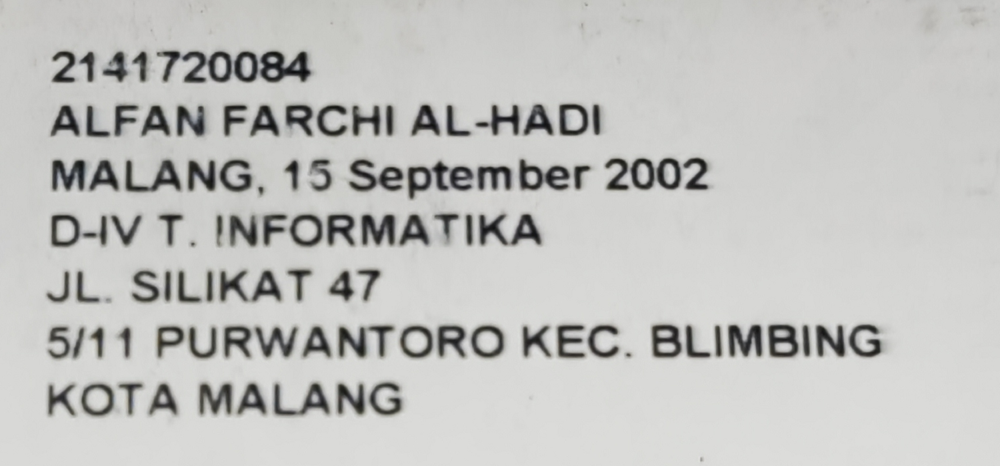

In [ ]:
img = image[1500:2200, 1100:2600]
cv2_imshow(img)

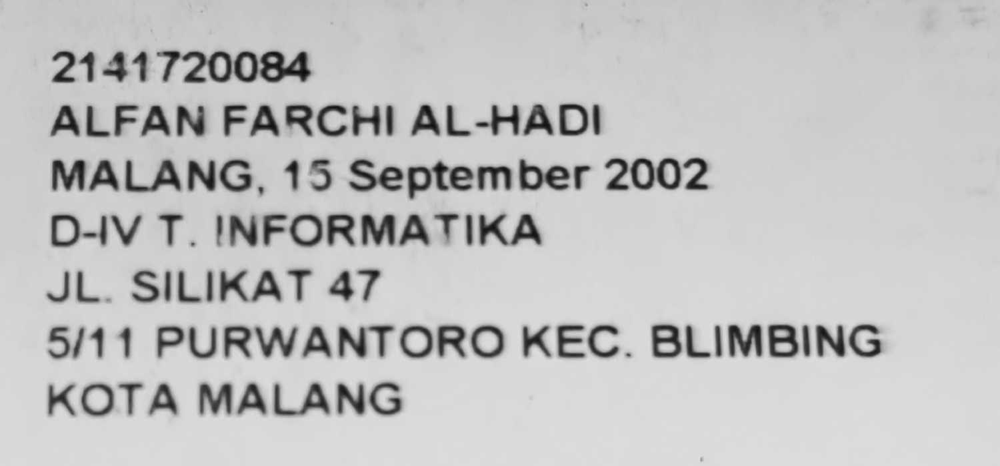

In [ ]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# show
cv2_imshow(gray)

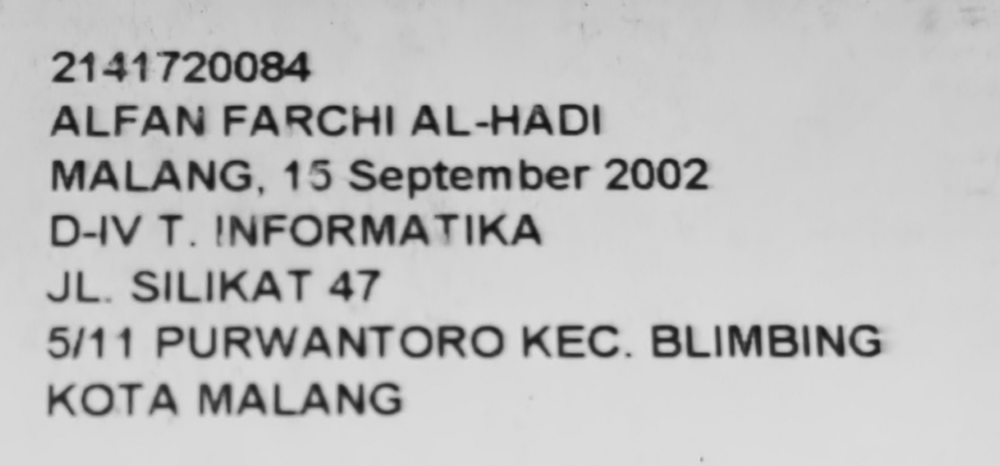

In [ ]:
blur = cv2.GaussianBlur(gray, (3,3), 0)
# check
cv2_imshow(blur)

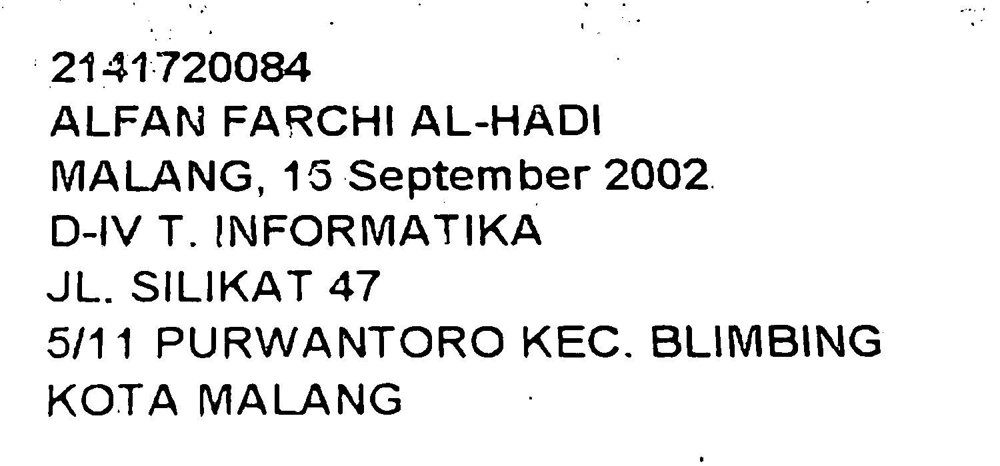

In [ ]:
adaptive = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 15, 5)
# check
cv2_imshow(adaptive)

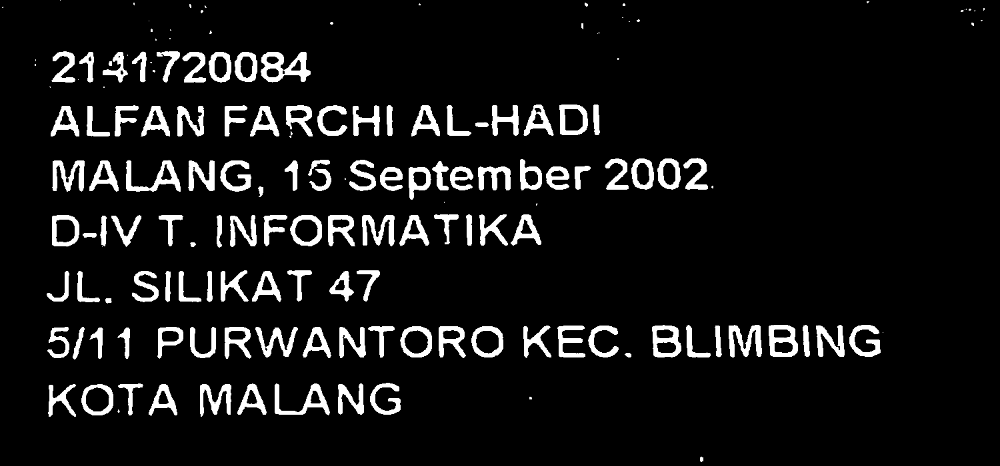

In [ ]:
# inverse image since we trained out model
# with black background
invertion = 255 - adaptive
# check
cv2_imshow(invertion)

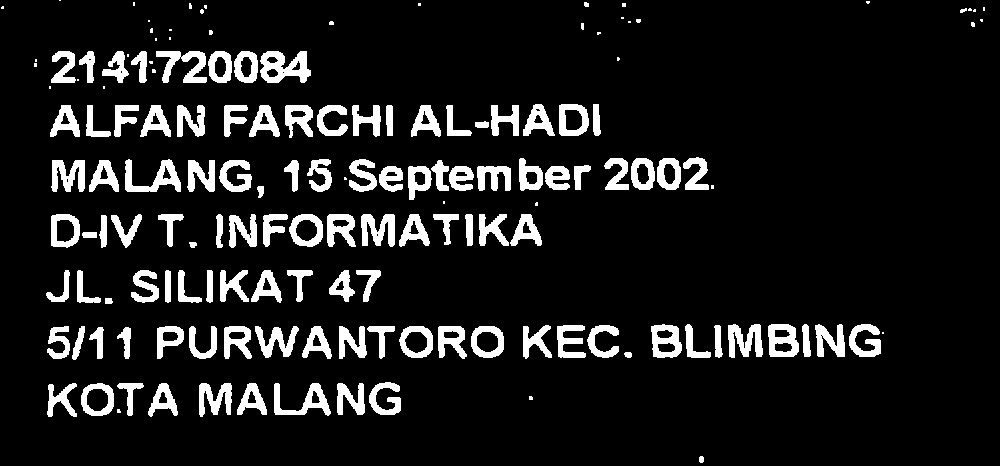

In [ ]:
dilation = cv2.dilate(invertion, np.ones((3,3)))
# check
cv2_imshow(dilation)

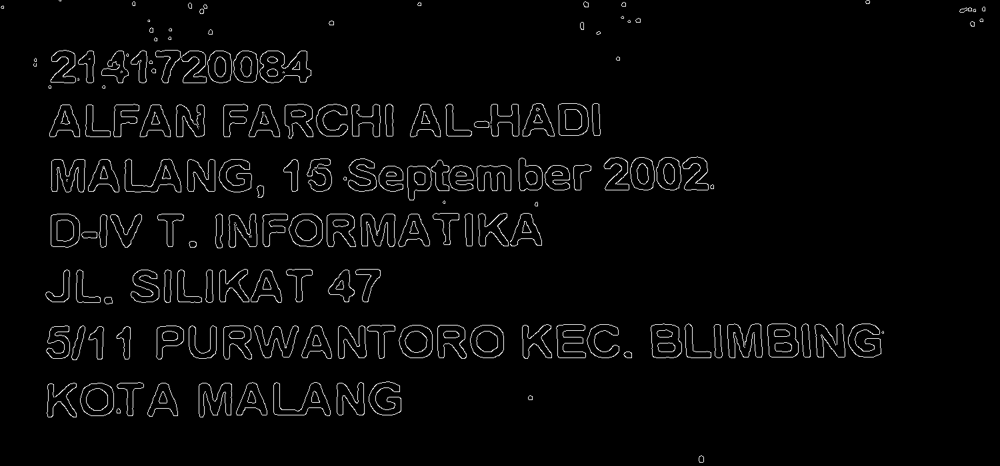

In [ ]:
edges = cv2.Canny(dilation, 40, 150)
cv2_imshow(edges)

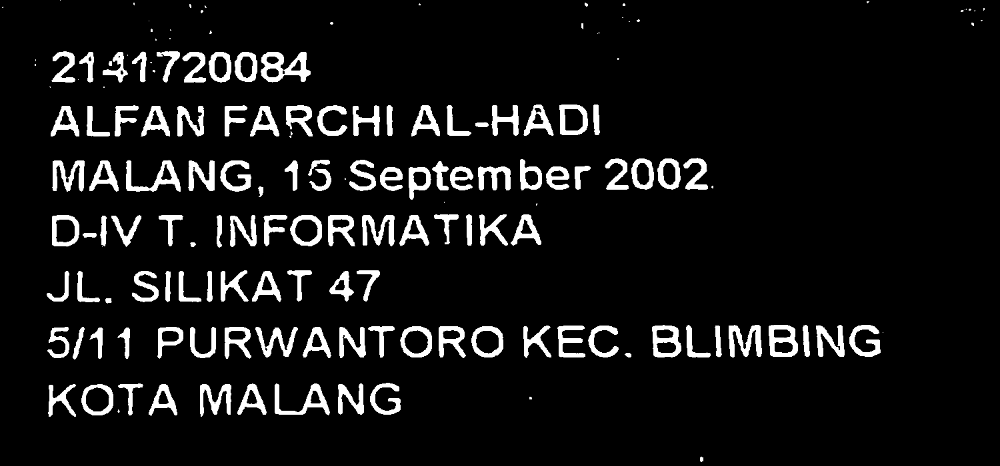

In [ ]:
# Test erode
erode = cv2.erode(invertion, np.ones((1,1)))
cv2_imshow(erode)

##FIND CONTOUR

In [ ]:
# Define function for contour detection
def find_contours(img):
  conts = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  conts = imutils.grab_contours(conts)
  conts = sort_contours(conts, method='left-to-right')[0]

  return conts

In [ ]:
conts = find_contours(dilation.copy())

In [ ]:
# Check contour value
conts

(array([[[ 3,  9]],
 
        [[ 2, 10]],
 
        [[ 2, 12]],
 
        [[ 5, 12]],
 
        [[ 5,  9]]], dtype=int32),
 array([[[51, 95]],
 
        [[51, 99]],
 
        [[54, 99]],
 
        [[54, 95]]], dtype=int32),
 array([[[52, 88]],
 
        [[52, 92]],
 
        [[54, 92]],
 
        [[54, 88]]], dtype=int32),
 array([[[ 98, 406]],
 
        [[ 96, 408]],
 
        [[ 96, 438]],
 
        [[ 95, 439]],
 
        [[ 95, 441]],
 
        [[ 91, 445]],
 
        [[ 90, 445]],
 
        [[ 89, 446]],
 
        [[ 82, 446]],
 
        [[ 78, 442]],
 
        [[ 78, 441]],
 
        [[ 77, 440]],
 
        [[ 76, 440]],
 
        [[ 75, 439]],
 
        [[ 70, 439]],
 
        [[ 69, 440]],
 
        [[ 69, 444]],
 
        [[ 70, 445]],
 
        [[ 70, 446]],
 
        [[ 74, 450]],
 
        [[ 75, 450]],
 
        [[ 77, 452]],
 
        [[ 78, 452]],
 
        [[ 79, 453]],
 
        [[ 95, 453]],
 
        [[ 98, 450]],
 
        [[ 99, 450]],
 
        [[102, 447]],
 
   

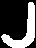

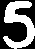

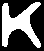

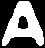

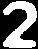

...

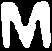

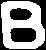

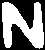

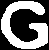

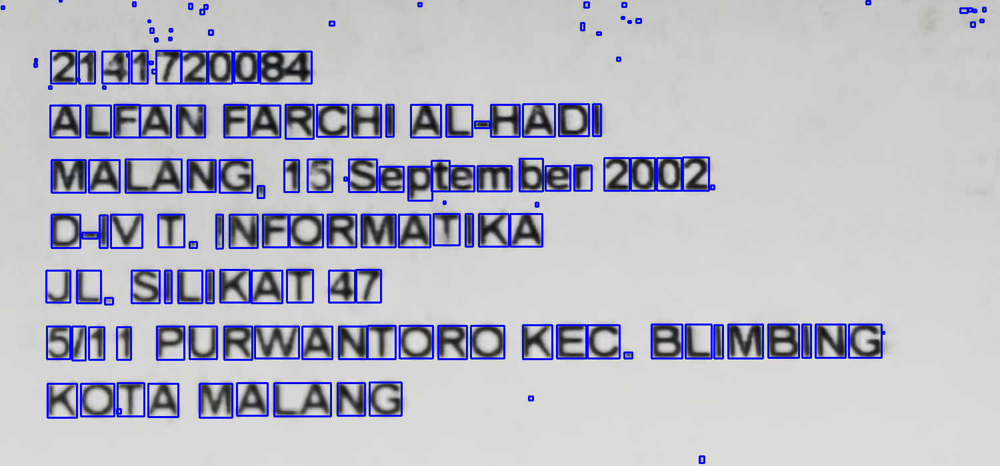

In [ ]:
# Get the char based on contour

# Setup min/max width/hight for char
min_w, max_w = 10, 160
min_h, max_h = 14, 140
img_copy = img.copy()  # original image for plotting countour result

for c in conts:
    (x, y, w, h) = cv2.boundingRect(c)  # find bounding box based on contour

    # get region of interest for char
    roi = gray[y:y+h, x:x+w]

    # Check if roi size is sufficient for further processing
    if roi.shape[0] > 0 and roi.shape[1] > 0:
        thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
        cv2_imshow(thresh)  # check

        # Build bounding box on original image
        cv2.rectangle(img_copy, (x, y), (x+w, y+h), (255, 0, 0), 2)

# Show bounding box on original image
cv2_imshow(img_copy)


In [ ]:
def extract_roi(img):
  roi = img[y:y+h, x:x+w]

  return roi

In [ ]:
def thresholding(img):
  thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
  return thresh

In [ ]:
def resize_img(img, w, h):
  if w > h:
    resized = imutils.resize(img, width=28)
  else:
    resized = imutils.resize(img, height=28)

  # (w, h) = resized.shape
  (h, w) = resized.shape

  # Calculate how many pixels need to fill char image
  dX = int(max(0, 28 - w) / 2.0)
  dY = int(max(0, 28 - h) / 2.0)

  filled = cv2.copyMakeBorder(resized, top=dY, bottom=dY, right=dX, left=dX, borderType=cv2.BORDER_CONSTANT, value=(0,0,0))
  filled = cv2.resize(filled, (28,28))

  return filled

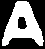

In [ ]:
# Demo for enlarge
(x, y, w, h) = cv2.boundingRect(conts[100])
test_image = thresholding(gray[y:y+h, x:x+w])

# show original test image
cv2_imshow(test_image)

# Show enlarge test image
cv2_imshow(cv2.resize(test_image, (28,28)))

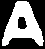

In [ ]:
# Demo by filled strategy
# (w, h) = test_image.shape
(h, w) = test_image.shape

test_image2 = resize_img(test_image, w, h)

cv2_imshow(test_image)
cv2_imshow(test_image2)

In [ ]:
def normalization(img):
  img = img.astype('float32') / 255.0 # convert to floating point
  img = np.expand_dims(img, axis=-1) # add depth
  return img

# Check
test_image2.shape, normalization(test_image2).shape

((28, 28), (28, 28, 1))

In [ ]:
def process_box(gray, x, y, w, h):

  roi = extract_roi(gray)
  thresh = thresholding(roi)
  (h, w) = thresh.shape
  resized = resize_img(thresh, w, h)

  # show result
  cv2_imshow(resized)

  normalized = normalization(resized)

  return (normalized, (x, y, w, h))

In [ ]:
# Detect every single char from contour
detected_char = []

for c in conts:
  (x, y, w, h ) = cv2.boundingRect(c)

  min_w, max_w = 10, 160
  min_h, max_h = 14, 140

  if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    detected_char.append(process_box(gray, x, y, w, h))

In [ ]:
# check pixel for detected char sample
detected_char[0][0]

array([[[0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ]],

       [[0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        

In [ ]:
# check bounding box for detected char sample
detected_char[0][1]

(69, 406, 36, 48)

In [ ]:
# Get all char pixel
pixels = np.array([px[0] for px in detected_char], dtype='float32')

# Get all box for detected char
boxes = [box[1] for box in detected_char]

pixels.shape

(107, 28, 28, 1)

In [ ]:
digits = '0123456789'
letters_uppercase = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
letters_lowercase = 'abcdefghijklmnopqrstuvwxyz'
special_characters = '.,'

char_list = digits + letters_uppercase + letters_lowercase + special_characters

print(char_list)

0123456789ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz.,


In [ ]:
# Predict
preds = network.predict(pixels)

# check shape -> JTI POLINEMA --> shoud be 11 (from 0 to 10)
preds.shape

4/4 [==============================] - 1s 19ms/step


(107, 36)

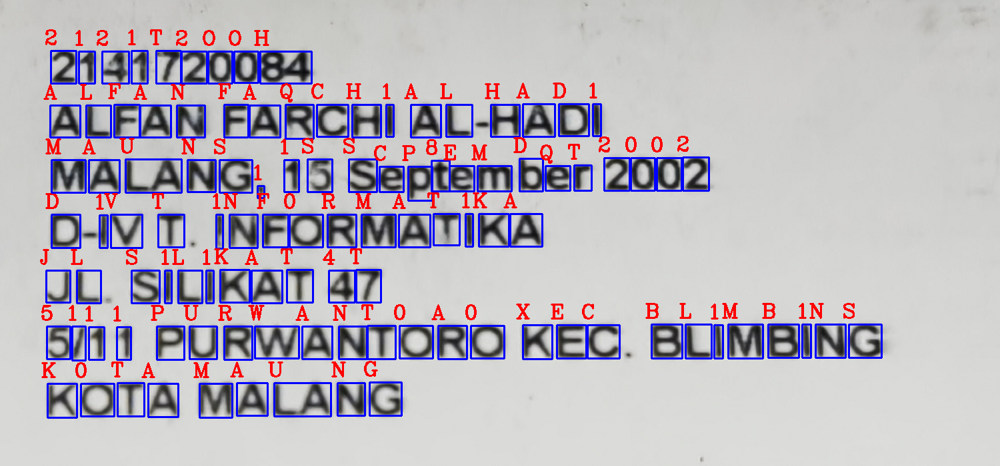

In [ ]:
# Show char with actual image
img_copy2 = img.copy()

for(pred, (x, y, w, h)) in zip(preds, boxes):
  i = np.argmax(pred)
  char_detected = char_list[i]

  cv2.rectangle(img_copy2, (x, y), (x+w, y+h), (255,0,0), 2)
  cv2.putText(img_copy2, char_detected, (x - 10, y - 10), cv2.FONT_HERSHEY_COMPLEX, 1, (0,0,255), 2)

cv2_imshow(img_copy2)

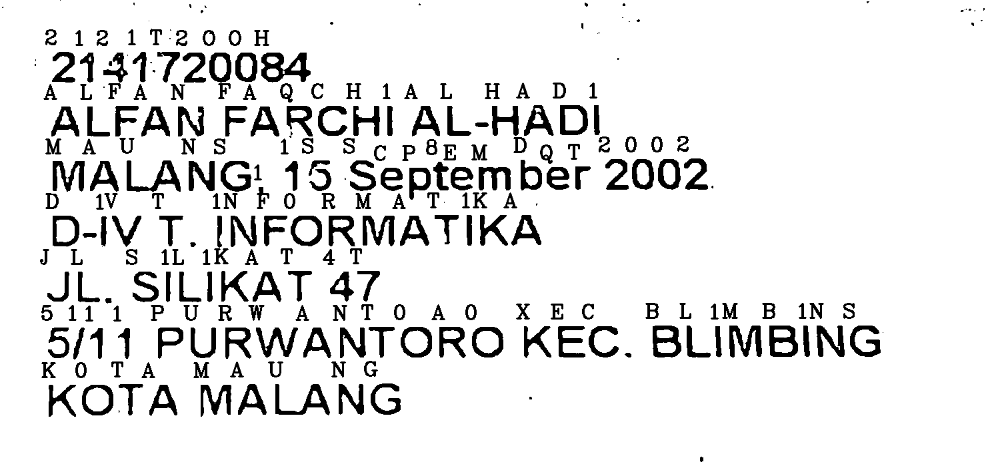

In [ ]:
img_copy2 = adaptive.copy()

for pred, (x, y, w, h) in zip(preds, boxes):
    i = np.argmax(pred)
    char_detected = char_list[i]

    cv2.rectangle(img_copy2, (x, y), (x+w, y+h), (255, 0, 0), 2)
    cv2.putText(img_copy2, char_detected, (x - 10, y - 10), cv2.FONT_HERSHEY_COMPLEX, 1, (0, 0, 0), 2)

cv2_imshow(img_copy2)